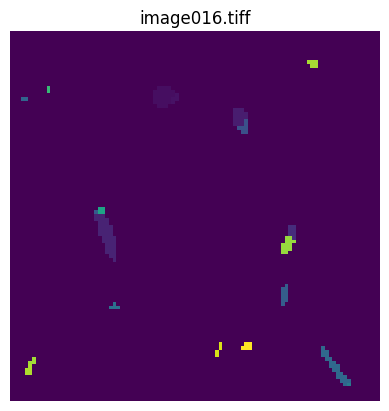

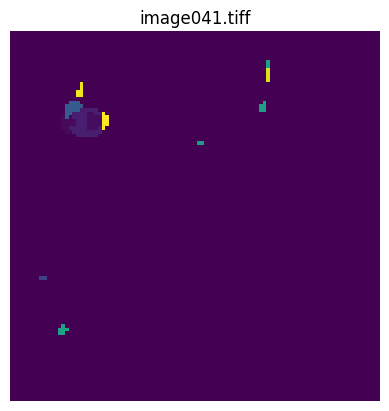

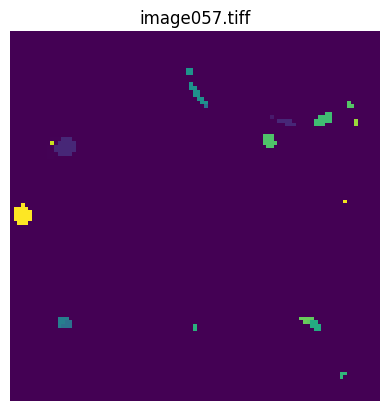

In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt

directorio = 'data_image' 
lista_archivos = os.listdir(directorio)

archivos_tiff = [archivo for archivo in lista_archivos if archivo.lower().endswith('.tiff')]

for archivo_tiff in archivos_tiff[:3]:
    ruta_imagen = os.path.join(directorio, archivo_tiff)
    imagen = Image.open(ruta_imagen)
    plt.imshow(imagen)
    plt.title(archivo_tiff)
    plt.axis('off')
    plt.show()

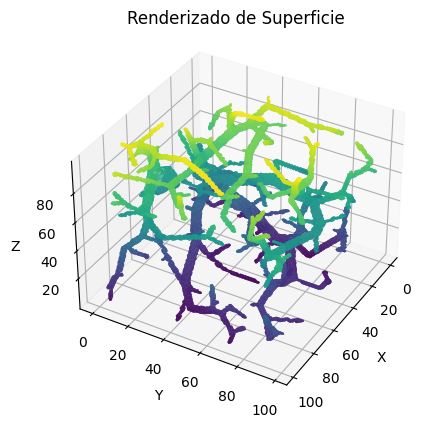

In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection, Path3DCollection
from skimage import measure

directorio = 'data_image'
lista_archivos = os.listdir(directorio)
archivos_tiff = [archivo for archivo in lista_archivos if archivo.lower().endswith('.tiff')]

archivos_tiff.sort()

volumen = None
for archivo_tiff in archivos_tiff:
    ruta_imagen = os.path.join(directorio, archivo_tiff)
    imagen = Image.open(ruta_imagen)
    imagen_array = np.array(imagen)
    if volumen is None:
        volumen = imagen_array
    else:
        volumen = np.dstack((volumen, imagen_array))

iso_valor = 5  # ajustable
vertices, caras, _, _ = measure.marching_cubes(volumen, level=iso_valor)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf(vertices[:, 0], vertices[:, 1], vertices[:, 2], triangles=caras, cmap='viridis')

ax.view_init(35, 30)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Renderizado de Superficie')

plt.show()


In [3]:
import os
import numpy as np
from PIL import Image
from skimage import measure
import plotly.graph_objs as go

directorio = 'data_image'
lista_archivos = os.listdir(directorio)
archivos_tiff = [archivo for archivo in lista_archivos if archivo.lower().endswith('.tiff')]

# Ordenar la lista en funcion de los nombres
archivos_tiff.sort()

volumen = None
for archivo_tiff in archivos_tiff:
    ruta_imagen = os.path.join(directorio, archivo_tiff)
    imagen = Image.open(ruta_imagen)
    imagen_array = np.array(imagen)
    if volumen is None:
        volumen = imagen_array
    else:
        volumen = np.dstack((volumen, imagen_array))

iso_valor = 5  # ajustable
vertices, caras, _, _ = measure.marching_cubes(volumen, level=iso_valor)

#figura interactiva con Plotly
fig = go.Figure(data=[go.Mesh3d(x=vertices[:, 0], y=vertices[:, 1], z=vertices[:, 2], 
                                i=caras[:, 0], j=caras[:, 1], k=caras[:, 2])])

fig.update_layout(scene=dict(aspectmode='cube', xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))
fig.update_layout(title='Renderizado de Superficie 3D')
fig.show()


In [4]:
x_corte = volumen.shape[0] // 2  #corte sagital en el medio del volumen
y_corte = volumen.shape[1] // 2  #corte coronal 
z_corte = volumen.shape[2] // 2  #corte axial 

sagital = volumen[x_corte, :, :]
coronal = volumen[:, y_corte, :]
axial = volumen[:, :, z_corte]

Xs, Ys = np.meshgrid(np.arange(sagital.shape[1]), np.arange(sagital.shape[0]))
Zs = np.ones_like(Xs) * z_corte

Xc, Zc = np.meshgrid(np.arange(coronal.shape[1]), np.arange(coronal.shape[0]))
Yc = np.ones_like(Xc) * y_corte

Ya, Za = np.meshgrid(np.arange(axial.shape[1]), np.arange(axial.shape[0]))
Xa = np.ones_like(Ya) * x_corte

fig.add_trace(go.Surface(z=Zs, x=Xs + x_corte, y=Ys, colorscale='Blues', showscale=False))
fig.add_trace(go.Surface(z=Zc, x=Xc, y=Yc + y_corte, colorscale='Reds', showscale=False))
fig.add_trace(go.Surface(z=Za + z_corte, x=Xa, y=Ya, colorscale='Greens', showscale=False))

fig.show()


In [5]:
fig = go.Figure()

def generate_plane_coordinates(orientation, position, shape):
    if orientation == 'axial':
        X, Y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        Z = np.ones_like(X) * position
    elif orientation == 'sagital':
        Y, Z = np.meshgrid(np.arange(shape[0]), np.arange(shape[2]))
        X = np.ones_like(Y) * position
    elif orientation == 'coronal':
        X, Z = np.meshgrid(np.arange(shape[1]), np.arange(shape[2]))
        Y = np.ones_like(X) * position
    return X, Y, Z

def get_slice_data(orientation, position, volume):
    if orientation == 'axial':
        return volume[:, :, position]
    elif orientation == 'sagital':
        return volume[position, :, :]
    elif orientation == 'coronal':
        return volume[:, position, :]

for orientation, position in [('sagital', x_corte), ('coronal', y_corte), ('axial', z_corte)]:
    X, Y, Z = generate_plane_coordinates(orientation, position, volumen.shape)
    slice_data = get_slice_data(orientation, position, volumen)
    fig.add_trace(go.Surface(z=Z, x=X, y=Y, surfacecolor=slice_data, colorscale='Gray', cmin=0, cmax=255))

fig.update_layout(scene=dict(aspectmode='cube', xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))
fig.update_layout(title='Intersecciones de Cortes con Vasculatura 3D')

fig.show()


In [6]:
import os
import numpy as np
from PIL import Image
from skimage import measure
import plotly.graph_objs as go

directorio = 'data_image'
lista_archivos = os.listdir(directorio)
archivos_tiff = [archivo for archivo in lista_archivos if archivo.lower().endswith('.tiff')]

archivos_tiff.sort()

volumen = None
for archivo_tiff in archivos_tiff:
    ruta_imagen = os.path.join(directorio, archivo_tiff)
    imagen = Image.open(ruta_imagen)
    imagen_array = np.array(imagen)
    if volumen is None:
        volumen = imagen_array
    else:
        volumen = np.dstack((volumen, imagen_array))

iso_valor = 5

fig = go.Figure()

def add_plane_to_figure(orientation, position, volume, fig, iso_value):
    cut_volume = np.zeros_like(volume)
    if orientation == 'axial':
        cut_volume[:, :, position] = volume[:, :, position]
    elif orientation == 'sagital':
        cut_volume[position, :, :] = volume[position, :, :]
    elif orientation == 'coronal':
        cut_volume[:, position, :] = volume[:, position, :]
    vertices, caras, _, _ = measure.marching_cubes(cut_volume, level=iso_value)
    fig.add_trace(go.Mesh3d(x=vertices[:, 0], y=vertices[:, 1], z=vertices[:, 2], 
                            i=caras[:, 0], j=caras[:, 1], k=caras[:, 2]))

    #planos
    if orientation == 'axial':
        fig.add_trace(go.Surface(z=[[position, position], [position, position]], 
                                 x=[[0, volumen.shape[0]], [0, volumen.shape[0]]], 
                                 y=[[0, 0], [volumen.shape[1], volumen.shape[1]]],
                                 opacity=0.2, showscale=False))
    elif orientation == 'sagital':
        fig.add_trace(go.Surface(x=[[position, position], [position, position]], 
                                 y=[[0, volumen.shape[1]], [0, volumen.shape[1]]], 
                                 z=[[0, 0], [volumen.shape[2], volumen.shape[2]]],
                                 opacity=0.2, showscale=False))
    elif orientation == 'coronal':
        fig.add_trace(go.Surface(y=[[position, position], [position, position]], 
                                 x=[[0, volumen.shape[0]], [0, volumen.shape[0]]], 
                                 z=[[0, 0], [volumen.shape[2], volumen.shape[2]]],
                                 opacity=0.2, showscale=False))
x_corte = volumen.shape[0] // 2
y_corte = volumen.shape[1] // 2
z_corte = volumen.shape[2] // 2

for orientation, position in [('sagital', x_corte), ('coronal', y_corte), ('axial', z_corte)]:
    add_plane_to_figure(orientation, position, volumen, fig, iso_valor)

# Configuración de visualización
fig.update_layout(scene=dict(aspectmode='cube', xaxis_title='X (Sagital)', yaxis_title='Y (Coronal)', zaxis_title='Z (Axial)'))
fig.update_layout(title='Cortes Axial, Sagital y Coronal de Vasculatura 3D')

# Visualizar
fig.show()


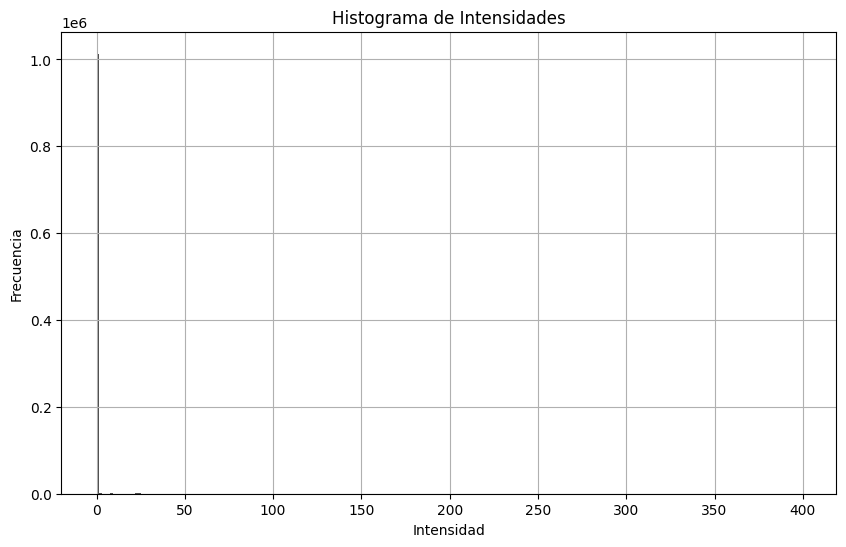

In [10]:
intensidades = volumen.ravel()
plt.figure(figsize=(10, 6))
plt.hist(intensidades, bins=256, color='black', alpha=0.7)
plt.title('Histograma de Intensidades')
plt.xlabel('Intensidad')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()
